# 2020.07.05_furyroad_generalizing
----

* Generalizing furyroad / colossus to support running arbitrary corpii in chained sequences
* Will think abotu parallelization



### Version Info
* madmax:  `afcf5bd`
* research:  `de42a45`


### Baselines to date 

#### OnlineRNN_83dc74824
This is from `2020.06.12_furyroad.ipynb`  and contains some pretty good 30min and 1day baselines

#### FuryRoad_7da46069e
This is from `2020.06.18_corpus_colossus.ipynb` and contains a decent OnlineBooster  (what was then called FuryRoad) baselines


#### Clossus_06cb73372
No emas but with AR in Alepah (bilinear with bias) (follows Colossus_f4aa826d6)


#### Colossus_b8588ea29
Colossus with gamma, omega and chaining (follows Colossus_d0136c8b1)

---
## History

#### 2020.06.27_furyroad_with_minibatches
* adding minibatch support to all the furyroad and online operators
* tested the gamma corpus
* tested chaining the corpii

#### 2020.06.19_starting_furyroad

* Initial research with furyroad (corpus colossus)
* I renanmed furyroad to be OnlineBooster and renamed the CorpusColussus package as furyroad


#### 2020.06.18_corpus_colossus ( no progress here)

* Was fooling around with  corpus colossus idea but renamed that whole idea to be furyroad
* Generated some interesting baselines


#### 2020.06.12_furyroad

* Testing disjoint 1 day returns as prediction targets
* sequential boosting with furyroad


#### 2020.06.10_refactored_rnns
refactored the rnns to support single step updates. Will test these

#### 2020.06.08_baselines_again
Since I am a total fucking retard and I delete all important shit - I'm going to waste anotehr day regenerating this fucking shit

Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization


#### 2020.06.04_recap
Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization



In [ ]:
# preamble
%alias_magic  nbagg matplotlib -p nbagg
%alias_magic  inline matplotlib -p inline
%load_ext memory_profiler
%load_ext line_profiler

from pylab import *
from madmax.api import *
mx = mx.reload()
mxtr = mxtr.reload()
plt.style.use('seaborn-whitegrid')

###################################################################
# Interactive configuration
# When running a config grid this will throw a FrozenException
# and the grid Config will be used
###################################################################
try:
    Config = mx.Configuration(
        name = 'etf_technical/2020.07.05_furyroad_generalizing/',
        mode = 'interactive',
        hps = mx.HPSet(
            start='20070101',
            end='20200501',
        ),
        code = '2020.07.05_furyroad_generalizing.ipynb',
        tb_port=6006,
    )
    disp('Running interactive configuration ', h=2)
except mx.Configuration.FrozenException:
    if Config.mode != 'grid':
        raise RuntimeError('An unexpected configruation encountered')
    disp('Running a grid configuration ', h=2)

device = 'cuda'
dtype = tr.float32
Config.start()



# to run run a grid of hyperparameters ...
####################################
# # hyperparameters
# mx.Config.hps = fr.HPSet(
# )
# mx.Config.code = ''
# # configs = []
# # for obs_weight in ['no_weight', 'dollar_weight', 'log_weight']:
# #     cfg = fr.Config.clone()
# #     cf
# #     cfg.hps = cfg.hps.clone( obs_weight=obs_weight )
# #     cfg.freeze()
# #     display_html( cfg )
# #     configs.append( cfg )
# # notebook = fr.Config.run_grid( configs, outfile=fr.Config.uri+'/../cadre_price_index.20200302 - weight_grid_results.ipynb', n_jobs=None )

## interactive global hyperparameters

In [4]:
# global  configruation
#######
if Config.mode == 'grid':
    raise Config.FrozenException( 'running grid configruation - skipping')

hps = Config.hps

hps.universe = mx.HPSet(
    start = '20100101',
    end='20200401',
    min_count=2000,
    min_dollar_vol=1e5
)


hps.feature_set = mx.HPSet(
    unadj_prices=[
        'open_unadj_30min', 'high_unadj_30min', 'low_unadj_30min', 'close_unadj_30min', 'mid_unadj_30min',
        'log_open_unadj_30min', 'log_close_unadj_30min',
    ],
    adj_prices=[
        'open_adj_30min', 'high_adj_30min', 'low_adj_30min', 'close_adj_30min',
        'mid_adj_30min', 'mid_adj_0D.12h.vwap', 'mid_adj_2D.12h.vwap', 'mid_adj_5D.vwap',
        'open_adj_0D.12h', 'high_adj_0D.12h', 'low_adj_0D.12h',
        'open_adj_2D.12h', 'high_adj_2D.12h', 'low_adj_2D.12h',
        'open_adj_5D', 'high_adj_5D', 'low_adj_5D',
    ],
    rel_prices=[
        'rel_price_260', 'rel_price_780', 'rel_price_3276',
    ],
    volumes=[
        'volume_unadj_30min', 'dollar_volume_unadj_30min', 'avg_dollar_volume',
    ],
    log_volumes=[
        'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid',
    ],
    rel_volume=[
        'rel_dollar_volume_260', 'rel_dollar_volume_780',
        'rel_dollar_volume_3276',
    ],
    calendar=[
        'timeofday', 'cos1_timeofday', 'cos2_timeofday', 'cos4_timeofday',
        'dayofweek', 'cos1_dayofweek', 'cos2_dayofweek',
        'weekofmonth', 'cos1_weekofmonth', 'cos2_weekofmonth',
        'monthofquarter', 'cos1_monthofquarter', 'cos2_monthofquarter',
        'quarterofyear', 'cos1_quarterofyear', 'cos2_quarterofyear',
    ],
    lagging=[
        'lagrtn_adj_30min', 'lagrtn_adj_1hr', 'lagrtn_adj_1day',
        'lagrtn_adj_30min_resid',
    ],
    mkt=[
        'mkt_lagrtn_30min',
        'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',
    ],
    vol=[
        'lagrtn_adj_30min_260.rw_sd', 'lagrtn_adj_30min_780.rw_sd', 'lagrtn_adj_30min_3276.rw_sd',
        'lagrtn_adj_30min_resid_260.rw_sd', 'lagrtn_adj_30min_resid_780.rw_sd', 'lagrtn_adj_30min_resid_3276.rw_sd',
    ],
    zscores=[
        'lagrtn_adj_30min_260.rw_zscore', 'lagrtn_adj_30min_780.rw_zscore', 'lagrtn_adj_30min_3276.rw_zscore',
        'lagrtn_adj_30min_resid_260.rw_zscore', 'lagrtn_adj_30min_resid_780.rw_zscore',
        'lagrtn_adj_30min_resid_3276.rw_zscore',
    ],
    betas=[
        'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min_2340.ew_beta',
        'lagrtn_adj_30min_3276.ew_beta', 'lagrtn_adj_30min_6500.ew_beta',
    ],
    afacs=[ 'bw_afac_30min', 'fw_afac_30min' ],
    technical=[
        'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
        'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
        'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
        'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
        'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
    ],    
    # features in teh daily dataset
    unadj_prices_daily=['open_unadj_30min_13.rw_mean'],
    lagging_daily=['lagrtn_adj_1day', 'lagrtn_adj_30min_resid_13.rw_mean',],
    mkt_daily=[ 'mkt_lagrtn_1day',  'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',],
    volumes_daily=['volume_unadj_30min_13.rw_mean', 'dollar_volume_unadj_30min_13.rw_mean', ],
    log_volumes_daily=[ 'log10_dollar_volume_30min_13.rw_mean', 'log10_dollar_volume_30min_resid_13.rw_mean'],
    afacs_daily=[ 'bw_afac_30min_13.rw_mean', 'fw_afac_30min_13.rw_mean', ],
)

hps.leading_rtns = [
    'leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day',
    'mkt_leadrtn_30min', 'mkt_leadrtn_1day',
    'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2', 'leadrtn_adj_30min_disjoint.3',
]

hps.leading_rtns_daily = [
  'leadrtn_adj_1day', 'mkt_leadrtn_1day', 'leadrtn_adj_1day_disjoint_30min', 
]

hps.weights = ['valid_30min', 'weight', ]  


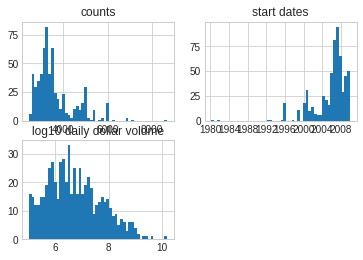

In [5]:
# identify the universe of ETFS
#############################################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )

etf_stats = etfd.compute_etf_stats()
etf_stats = etf_stats[etf_stats.vendor=='kibot']
orig_len = len( etf_stats )
# drop etfs without enough history
etf_stats = etf_stats[(etf_stats['start'] <= hps.universe.start ) 
                      & (etf_stats['end'] > hps.universe.end ) 
                      & (etf_stats['n'] >= hps.universe.min_count)
                      & (etf_stats['daily_dollar_volume_adj'] >= hps.universe.min_dollar_vol ) ]

disp( 'after filtering', len( etf_stats ), 'symbols out of original ' ,orig_len )

etf_stats = (etf_stats
             .merge( etfd.all_etfs, how='left', left_on='symbol', right_on='Symbol' )
             .drop( columns=['Symbol', 'ETP Name', 'Leveraged / Inverse' ])
             .rename( columns={'Asset Class':'asset_class', 'Description':'name'} )
             .fillna( 'Not Specified')             
             .set_index('symbol')
            )
disp( etf_stats.groupby('asset_class').name.count() )

ax = subplot( 2,2, 1 )
etf_stats.n.hist(ax=ax, bins=50)
ax.set_title( 'counts')

ax = subplot( 2,2, 2 )
etf_stats.start.hist(ax=ax, bins=50)
ax.set_title( 'start dates')

ax = subplot( 2,2, 3 )
etf_stats.daily_dollar_volume_adj.log10().hist(ax=ax, bins=50)
ax.set_title( 'log10 daily dollar volume')

# this is the universe we will work with. 
# HERO has a massive returns spike in 2015.11.09 - which throws off residualization quite a bit.
hps.universe.symbols = sorted( etf_stats.index.values )


In [6]:
# build up the data and features
#############################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )
from research.etf_technical import etf_technical_20200517 as etfrc; reload( etfrc )

# fetch the data as a dataarray
builder = etfd.BuildDataWithAfacs( symbols=hps.universe.symbols, mkt_only=True, start=hps.start ,).set( memoize=True )
builder.data = None
disp( 'builder BuildDataWithAfacs_7f79ef4bf  expected got', builder.hash() )
da = builder(  )
df = builder.output_meta

# hyperparams related to computing returns and residuals
hps.returns_hps = mx.HPSet(    
    price_windows=[ 24*1, 24*5, 24*10],
    beta_halflifes=[13 * 90, 13 * 180, 13 * 252, 13*500],
    dollar_volume_window=13*180,
    ema_halflifes=[20 * 13, 60 * 13, 252 * 13],
    resid_halflife=13,
    
)
# compute log-returns, log-dollar-volume, betas, residual returns and clean up the data
rtn_computer = etfrc.compute_returns_and_betas( 
    start=hps.start, end=None,     
    dollar_volume_window=hps.returns_hps.dollar_volume_window, 
    price_windows = hps.returns_hps.price_windows,
    beta_halflifes=hps.returns_hps.beta_halflifes, 
    resid_halflife=None,    
) 
rtn_computer.data = builder
disp( 'expected compute_returns_and_betas_ea966833a got', rtn_computer.hash(), h=4, color='teal' )

# add relative price and relative volume features
rel_price_and_vols = etfrc.add_relative_price_and_volumes( emas=hps.returns_hps.ema_halflifes )
rel_price_and_vols.data = rtn_computer
disp( 'expected add_relative_price_and_volumes_a65da371a got', rel_price_and_vols.hash(), h=4, color='teal' )

# add volatility and calendar features
add_vols = etfrc.add_volatilities( emas=hps.returns_hps.ema_halflifes )
add_vols.data = rel_price_and_vols
disp( 'expected add_volatilities_77ca914f0 got', add_vols.hash(), h=4, color='teal' )

# add disjoint returns
disjoint_returns= etfrc.add_dijoint_returns( lags=(1, 2, 3) )
disjoint_returns.data = add_vols
disjoint_returns.features = ['leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day', 'lagrtn_adj_30min' ]
disp( 'expected add_dijoint_returns_361e1f0b0 got', disjoint_returns.hash(), h=4, color='teal' )
da = disjoint_returns(   )


# build daily data
daily_data = etfrc.build_daily_data( timeofday=dt.time(16,) ).set(memoize=True)
daily_data.data = disjoint_returns
daily_data.features = ['volume_unadj_30min', 'dollar_volume_unadj_30min', 'lagrtn_adj_30min_resid', 'bw_afac_30min', 'fw_afac_30min', 'open_unadj_30min',  
                       'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid' ]
disp( 'expected build_daily_data_46a83a0b7 got', daily_data.hash(), h=4, color='teal' )
dda = daily_data()

## _(Baseline from 2020.06.27_furyroad_with_minibatches)_
# Colossus_b8588ea29
## Colossus with gamma, omega and chaining (follows Colossus_d0136c8b1) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,0.213615,1.116570,0.022680,0.000514,28.250521,3.417864,0.600864,0.601,0.54276
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,0.213615,0.849518,0.012425,0.000154,15.496664,1.719510,0.600864,0.601,0.54276


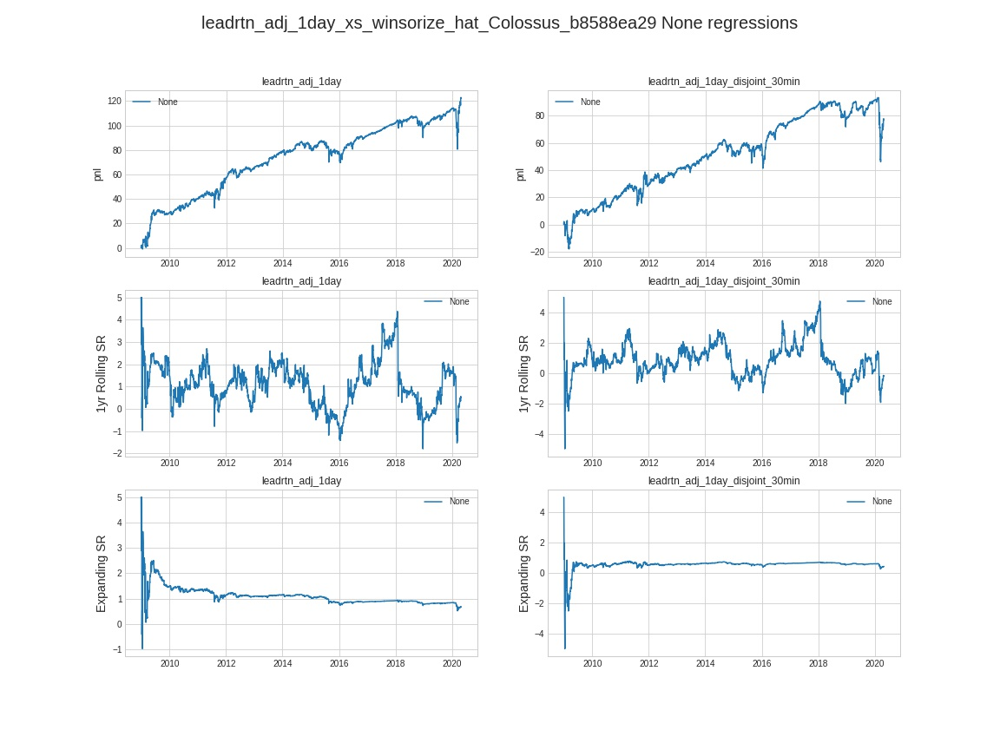

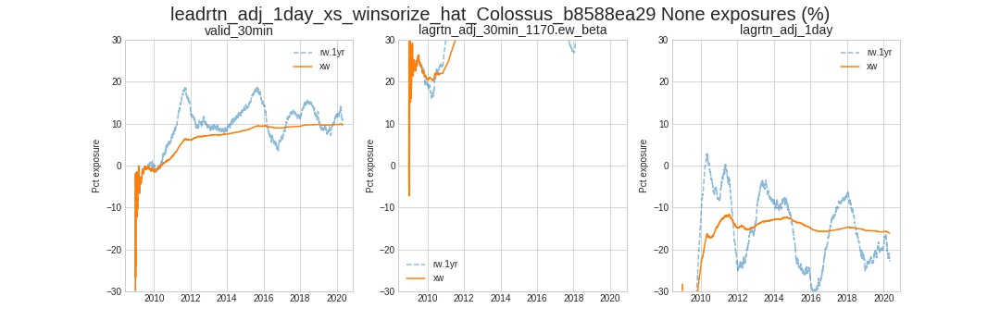

,0
leadrtn_adj_1day_hat_Colossus_7ddb133ff,fcst_0
leadrtn_adj_1day_hat_Colossus_98060ed3a,fcst_1
leadrtn_adj_1day_hat_Colossus_e9be30f83,fcst_2
leadrtn_adj_1day_hat_Colossus_d0136c8b1,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_b8588ea29,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.864668,0.338171,0.338064,0.563575
fcst_1,0.864668,1.000000,0.367904,0.367830,0.588541
fcst_2,0.338171,0.367904,1.000000,0.999688,0.451609
fcst_3,0.338064,0.367830,0.999688,1.000000,0.453175
fcst_4,0.563575,0.588541,0.451609,0.453175,1.000000


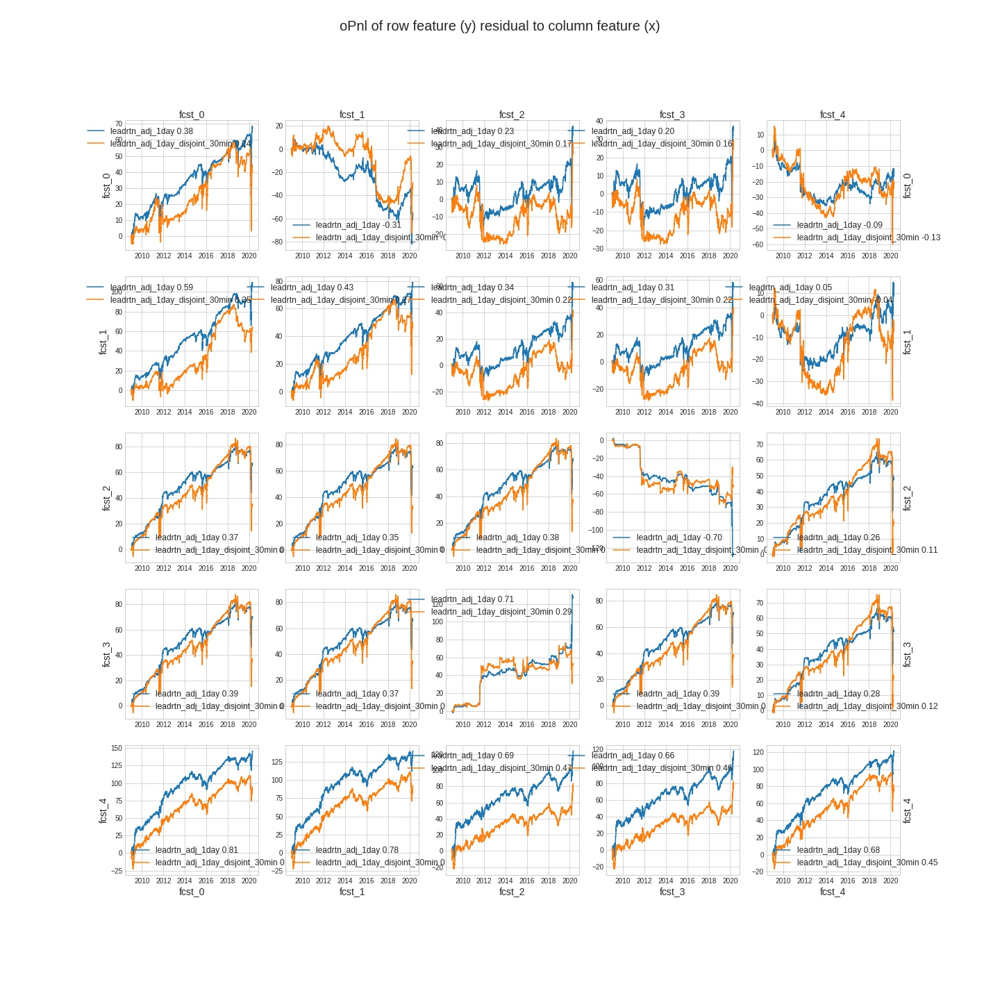

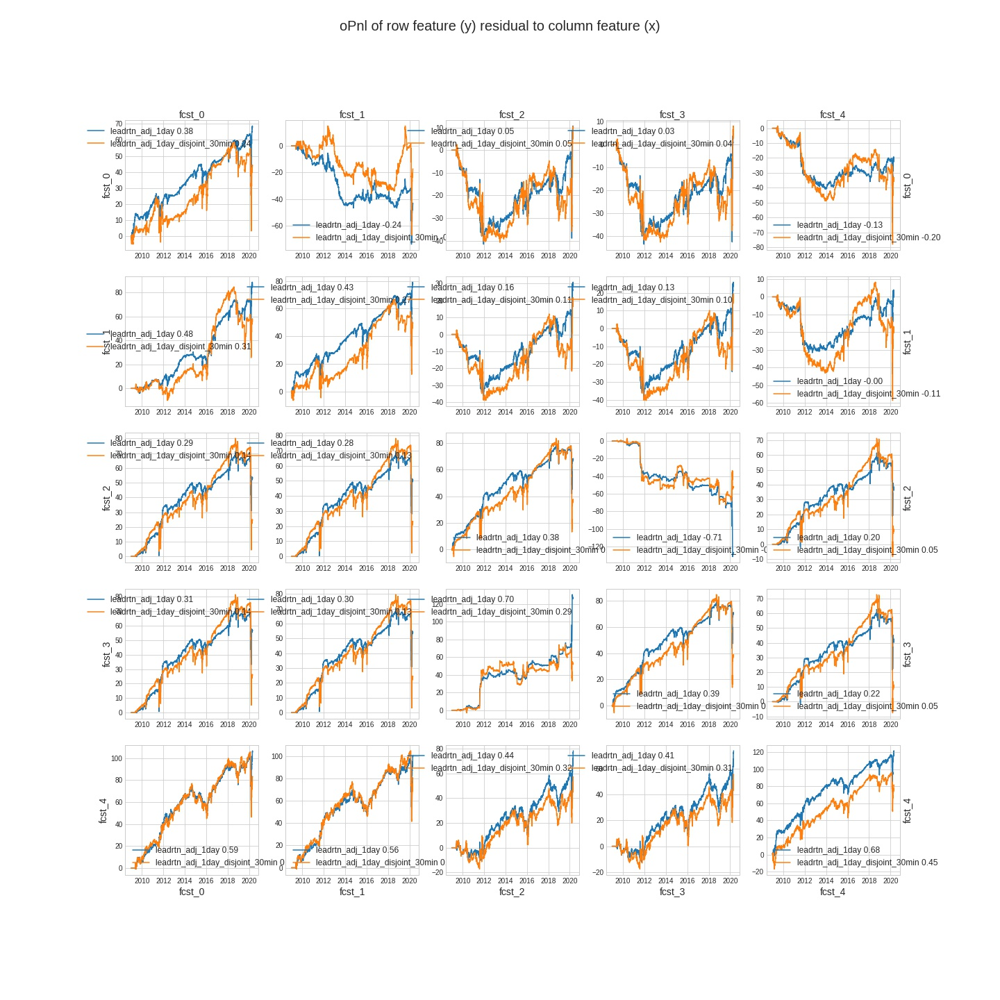

In [5]:
# Colossus_b8588ea29
############################################################################
BASELINE_NAME = 'Colossus_b8588ea29'
PREV_BASELINE = 'Colossus_d0136c8b1'
BASELINE_NOTES = 'Colossus with gamma, omega and chaining'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=True,
        minibatch=20,
        batch_size=2000,
        burn_in=2000,
        priming=200,        
        # defaults
        boost=1e-1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, #dict( hypergrad=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),
        tv=None,
        ortho=5,
        alpha=mx.HPSet(
            mode='bilinear', #with mean and avg-norm normalization
            rank=None,
            M=1,
            ar=10,
            ridge=1e-7,
            lr=1e-7,                        
            use_bias=True,
            halflifes_adam=10,
            halflife_polyak=None,
            ortho=5,
            transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
                                  hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                                  post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
        ),
        omega=mx.HPSet( lr=1.0, ridge=1e-2, shift=None, transformer=None, halflife_polyak=20, act='softmax' ),
        gamma=mx.HPSet( lr=1.0, ridge=1e-9, use_bias=True, transformer=None, halflife_polyak=20, halflifes_adam=20 ),
        theta=None, #mx.HPSet( lr=1e-4, ridge=1e-3, shift=None, hyper_tune=None, act='softmax' ),
        zeta_transformer=mx.HPSet( winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3) ), 
    ),    
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_0373847a3
## Refactored corpus colossus with (αγω) (follows Colossus_b8588ea29) 

/home/fj/cloud/code/madmax/experiment/hpset.py:17: UserWarning: converting dict hyper_tune={'hypergrad': {'lr': 1000.0, 'decay': 0.8, 'ridge': 0, 'style': 'log'}}  to OrderedDict - use HPSet instead 
  warnings.warn( f'converting dict {k}={v}  to OrderedDict - use HPSet instead ' )


loss.py - using boosted structure 
loss.py - using boosted structure 


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,0.098533,1.280581,0.021939,0.000481,27.336313,3.322185,0.668298,0.672921,0.628011
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,0.098533,0.964430,0.012641,0.000160,15.755752,1.747780,0.668298,0.672921,0.628011


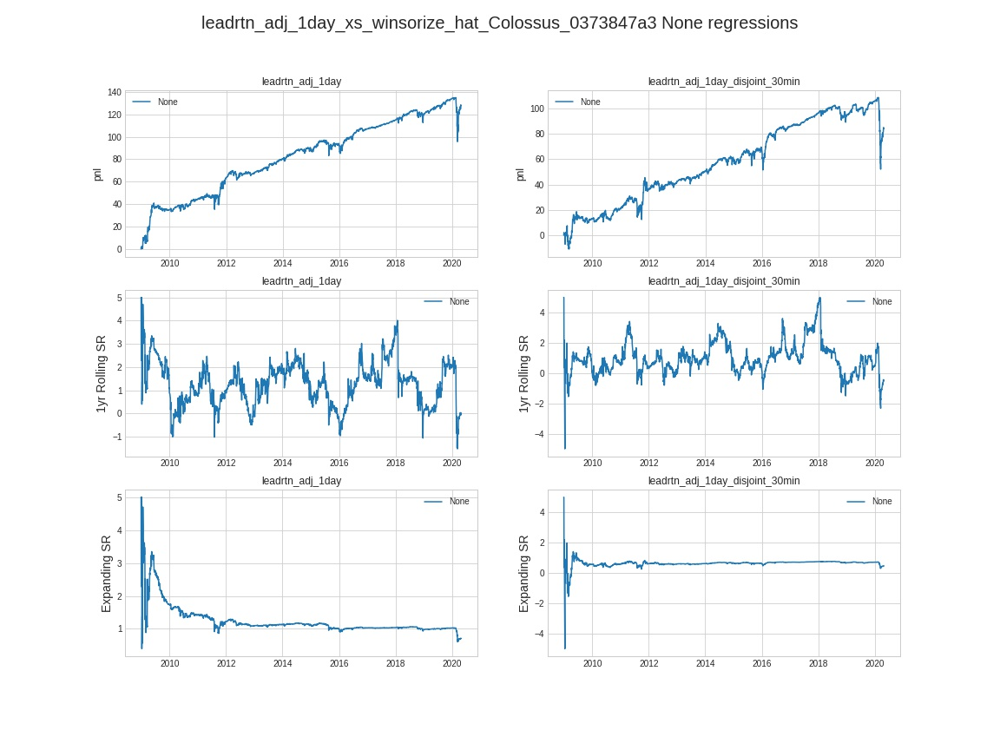

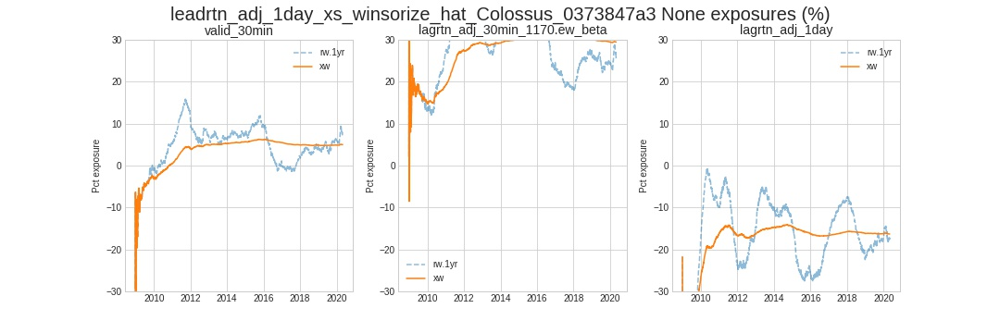

,0
leadrtn_adj_1day_hat_Colossus_98060ed3a,fcst_0
leadrtn_adj_1day_hat_Colossus_e9be30f83,fcst_1
leadrtn_adj_1day_hat_Colossus_d0136c8b1,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_b8588ea29,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0373847a3,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.367904,0.367830,0.588618,0.540170
fcst_1,0.367904,1.000000,0.999688,0.451678,0.410012
fcst_2,0.367830,0.999688,1.000000,0.453243,0.410994
fcst_3,0.588618,0.451678,0.453243,1.000000,0.901196
fcst_4,0.540170,0.410012,0.410994,0.901196,1.000000


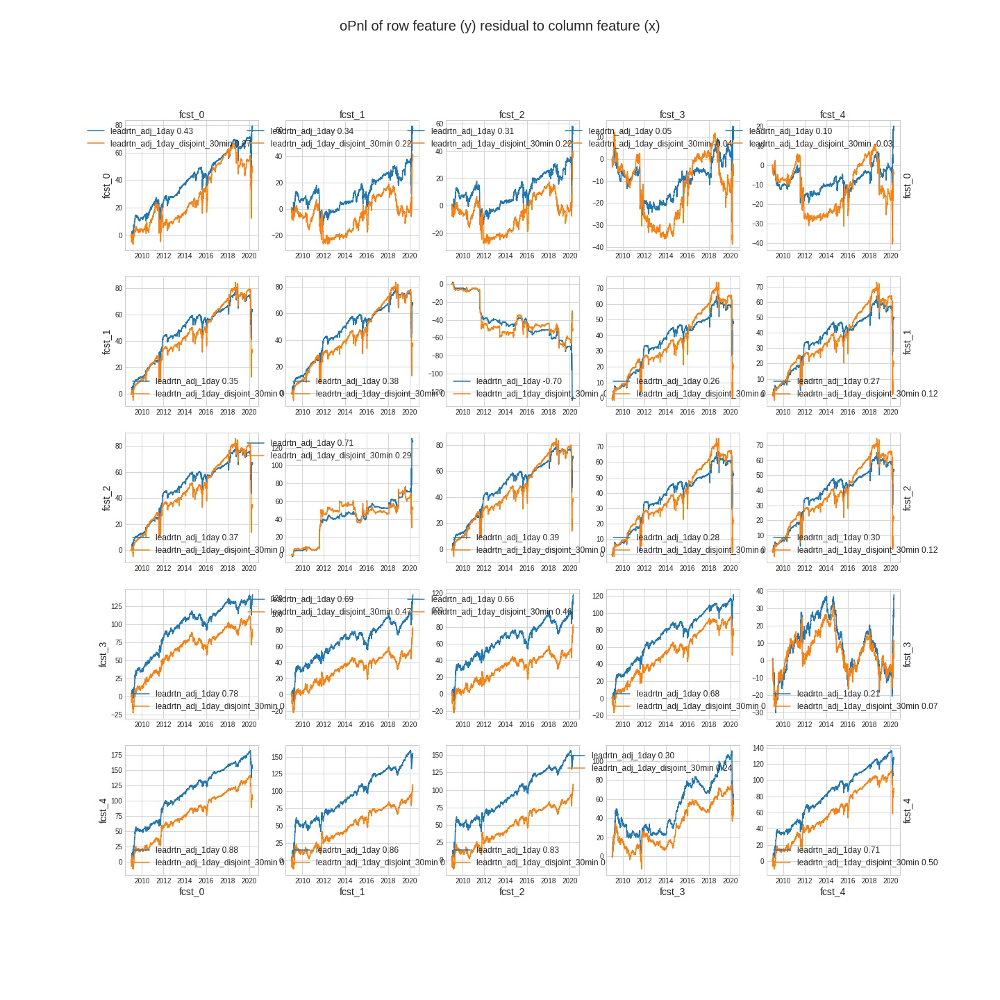

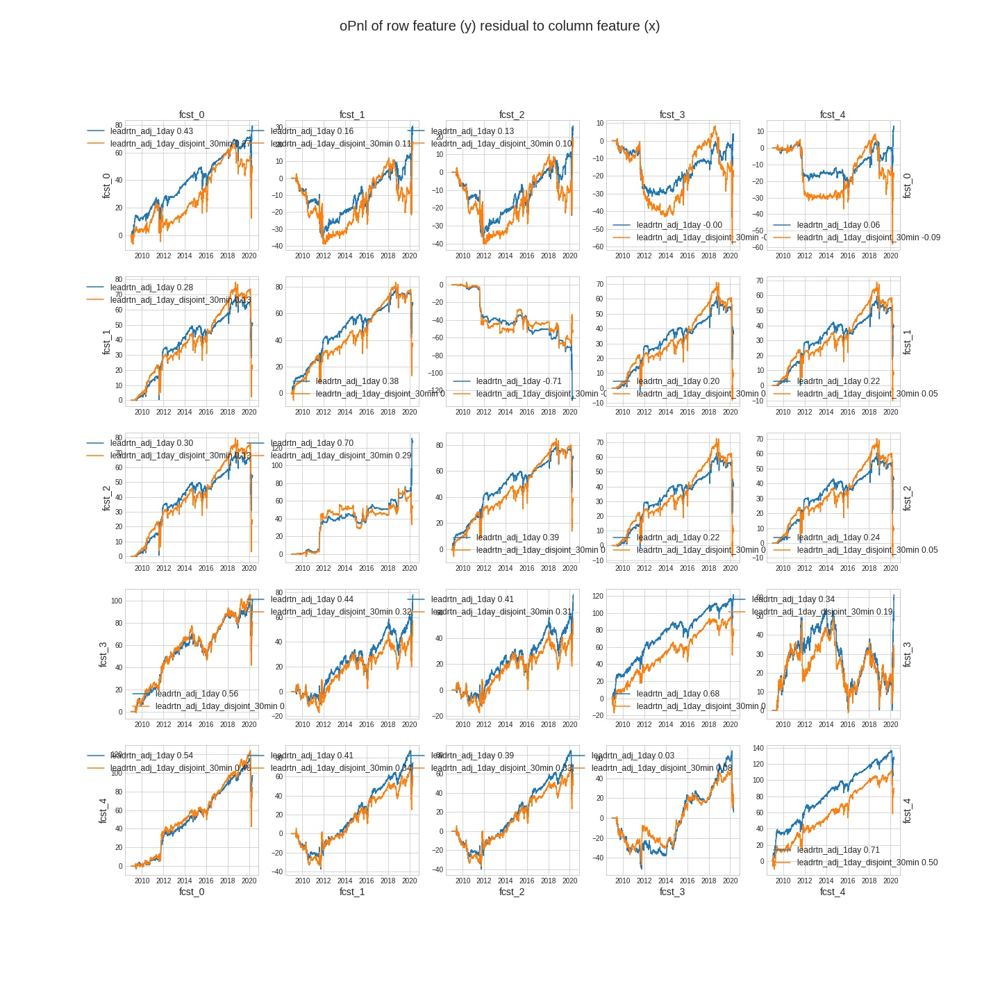

In [24]:
# Colossus_0373847a3 
############################################################################
BASELINE_NAME = 'Colossus_0373847a3'
PREV_BASELINE = 'Colossus_b8588ea29'
BASELINE_NOTES = 'Refactored corpus colossus with (αγω)'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=False,
        minibatch=20,
        batch_size=3000,
        burn_in=3000,
        priming=200,        
        # defaults and zeta
        transformer=mx.HPSet( winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3) ), 
        boost=None,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, 
        tv=None,
        ortho=5,
        num_its=1,
        corpii = [
            mx.HPSet( 
                type='alpha', mode='bilinear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
                transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
                                        hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                                        post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
            ),
            mx.HPSet( 
                type='gamma', lr=1e-4, ridge=1e-5, use_bias=True, halflife_polyak=20, halflifes_adam=20, mode='linear', act=None, 
                C_transformer=None, Yh_transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                   
                hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='omega', lr=1e-2, ridge=1e-9, halflife_polyak=20, act='tanh',
                transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
                hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) )
            ),
#             mx.HPSet( 
#                 type='alpha', mode='linear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-5, use_bias=True,
#                 transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
#                                       hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                                       post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=None) ),                
#                 hyper_tune=dict( hypergrad=dict( lr=100, decay=0.80, ridge=0, style='log' ) ),
#                 halflife_polyak=1,
#                 halflifes_adam=10,
#             ),
#             mx.HPSet( 
#                 type='omega', lr=10.0, ridge=1e-9, halflife_polyak=10, act='simplex', 
#                 hyper_tune=dict( hypergrad=dict( lr=100, decay=0.80, ridge=0, style='log' ) ),
#             ),
#             mx.HPSet( type='alpha', mode='linear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-6, use_bias=True,
#                       transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
#                                             hydra=False, ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY, 60*INTS_PER_DAY], 
#                                             post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
#             ),
#             mx.HPSet( type='alpha', mode='bilinear', act=None, rank=None, H=1, ar=None, ridge=1e-7, lr=1e-7, use_bias=True,
#                       transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
#                                             hydra=False, ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                                             post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
#             ),
            #,
            #mx.HPSet( type='theta', lr=1e-4, ridge=1e-3, shift=None, hyper_tune=None, act='simplex' ),
        ],
        
    )
)
    

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_8f41abb69
## Corpus colossus on 30min data (with α and γ) 

/home/fj/cloud/code/madmax/experiment/hpset.py:17: UserWarning: converting dict hyper_tune={'hypergrad': {'lr': 1000.0, 'decay': 0.8, 'ridge': 0, 'style': 'log'}}  to OrderedDict - use HPSet instead 
  warnings.warn( f'converting dict {k}={v}  to OrderedDict - use HPSet instead ' )


loss.py - using boosted structure 
loss.py - using boosted structure 


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25508688,0.837615,-0.010453,0.583836,0.008225,6.765127e-05,37.348660,5.366886,0.353783,0.269059,0.237926
leadrtn_adj_30min_disjoint.1,NaN,25508688,0.837591,-0.010453,0.068045,0.000345,1.192093e-07,2.604079,0.483175,0.353783,0.269059,0.237926


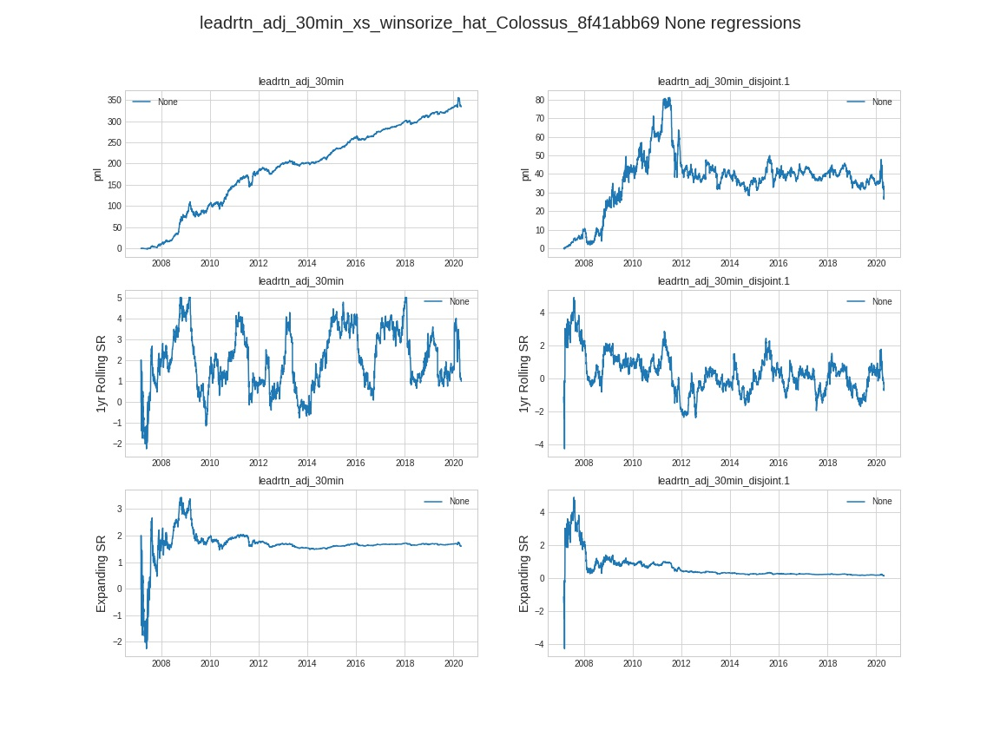

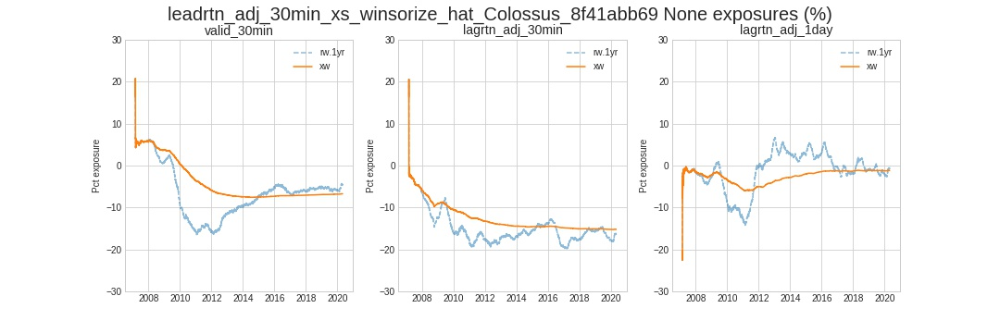

,0
leadrtn_adj_30min_xs_winsorize_hat_Colossus_8f41abb69,fcst_0


,fcst_0
fcst_0,1.0


,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.592087,0.543879


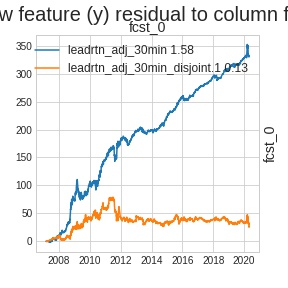

,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.592087,0.543879


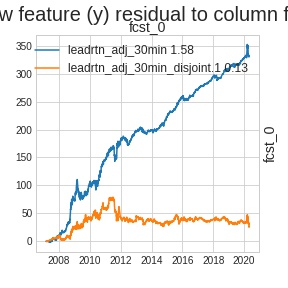

In [33]:
# Colossus_8f41abb69 
############################################################################
BASELINE_NAME = 'Colossus_8f41abb69'
PREV_BASELINE = None
BASELINE_NOTES = 'Corpus colossus on 30min data (with α and γ) '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 13
data = disjoint_returns 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1'],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_30min']
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=False,
        minibatch=20,
        batch_size=3000,
        burn_in=5000,
        priming=200,        
        # defaults and zeta
        transformer=mx.HPSet( winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3) ), 
        boost=None,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, 
        tv=None,
        ortho=5,
        num_its=1,
        corpii = [
            mx.HPSet( 
                type='alpha', mode='bilinear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
                transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
                                        hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                                        post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
            ),
            mx.HPSet( 
                type='gamma', lr=1e-4, ridge=1e-5, use_bias=True, halflife_polyak=20, halflifes_adam=20, mode='linear', act=None, 
                C_transformer=None, Yh_transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                   
                hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
#             mx.HPSet( 
#                 type='omega', lr=1e-2, ridge=1e-9, halflife_polyak=20, act='tanh',
#                 transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) )
#             ),
        ],
        
    )
)
    

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_c54099806
## Baseline for centauri corpus (follows Colossus_0373847a3) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,-0.062238,1.918801,0.011749,0.000138,14.639554,2.918039,0.890645,0.919848,0.865507
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,-0.062238,1.193755,0.004956,0.000025,6.176002,1.721002,0.890645,0.919848,0.865507


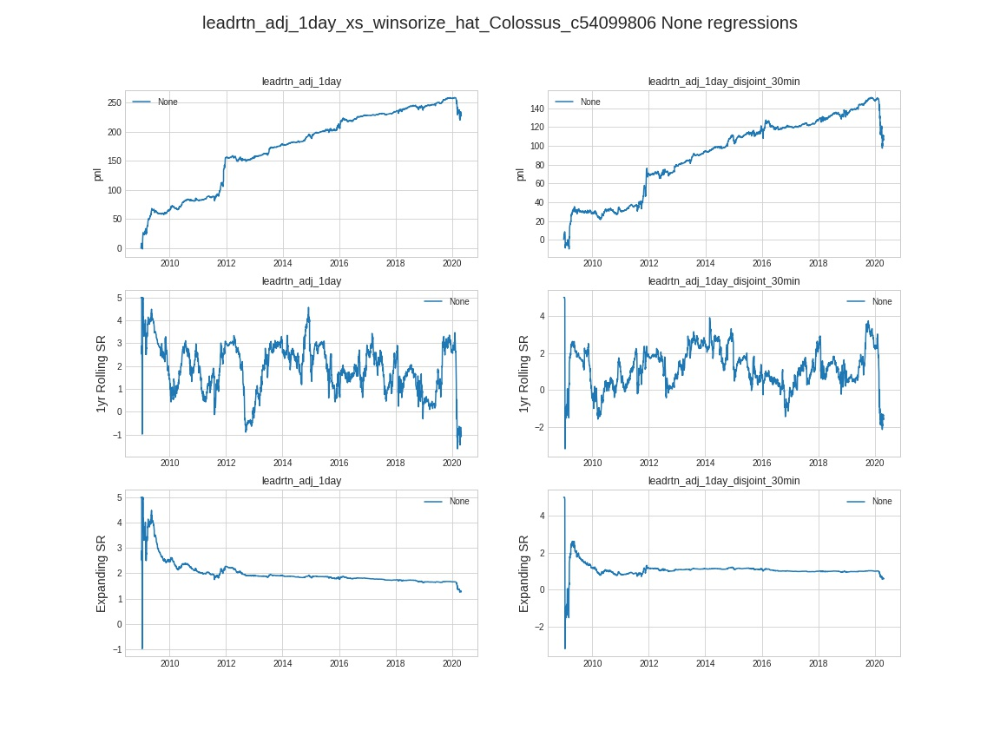

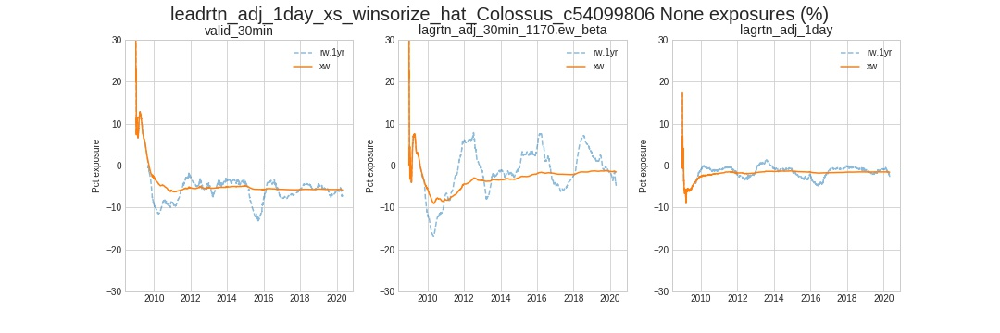

,0
leadrtn_adj_1day_hat_Colossus_e9be30f83,fcst_0
leadrtn_adj_1day_hat_Colossus_d0136c8b1,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_b8588ea29,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0373847a3,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_c54099806,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.999688,0.451678,0.410065,0.036644
fcst_1,0.999688,1.000000,0.453243,0.411049,0.036636
fcst_2,0.451678,0.453243,1.000000,0.901253,0.326623
fcst_3,0.410065,0.411049,0.901253,1.000000,0.385786
fcst_4,0.036644,0.036636,0.326623,0.385786,1.000000


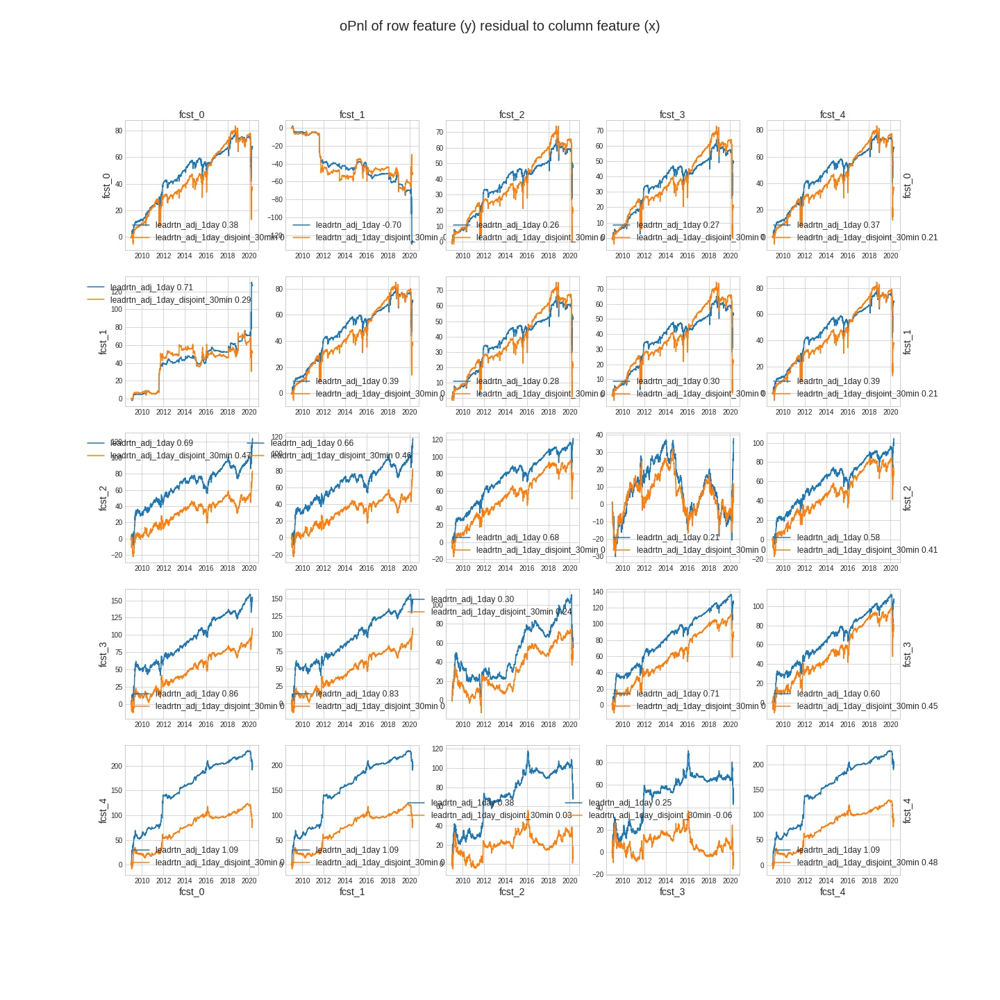

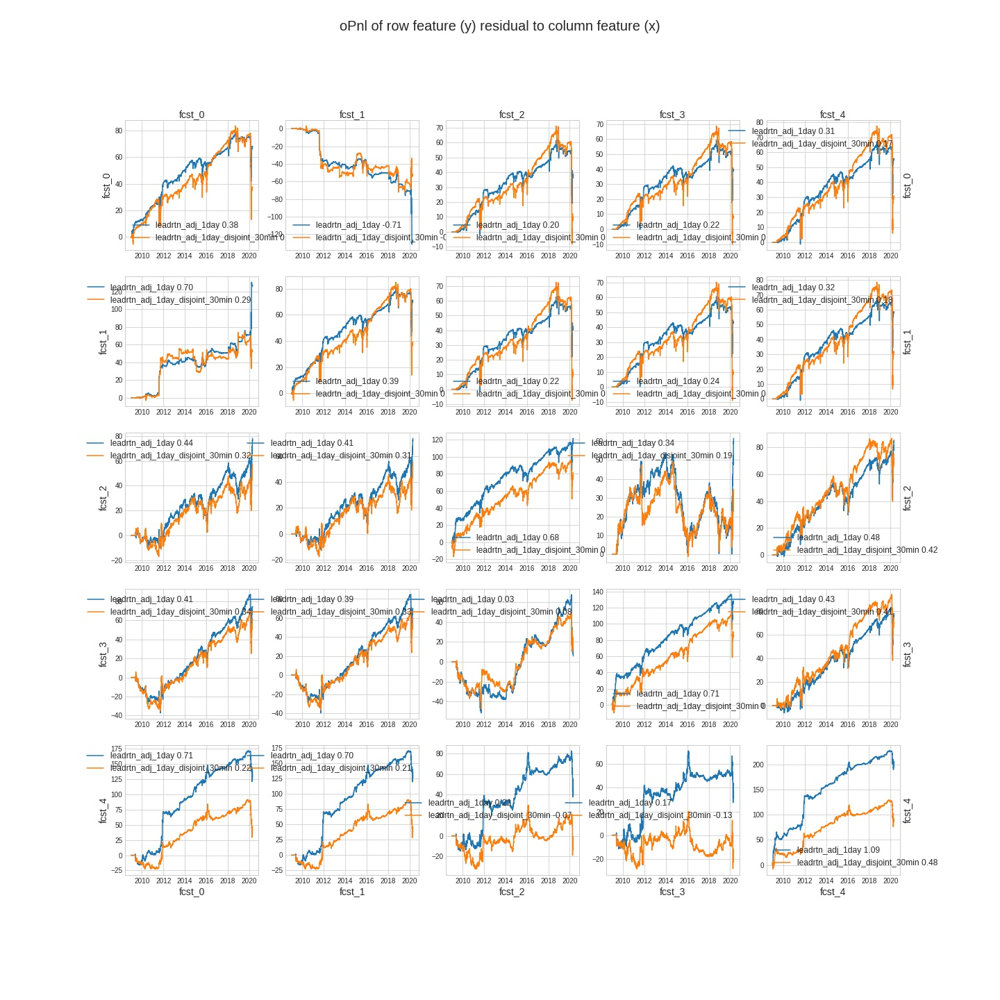

In [7]:
# Colossus_c54099806
############################################################################
BASELINE_NAME = 'Colossus_c54099806'
PREV_BASELINE = 'Colossus_0373847a3'
BASELINE_NOTES = 'Baseline for centauri corpus'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=False,
        minibatch=20,
        batch_size=3000,
        burn_in=3000,
        priming=200,        
        # defaults and zeta
        transformer=mx.HPSet(  winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3)  ), 
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, 
        tv=None,
        ortho=5,
        num_its=1,
        corpii = [
            mx.HPSet( 
                type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
                transformer=mx.HPSet( 
                    winsorize=0.05, 
                    pre_normalize=mx.HPSet( halflife=100, clip=3 ),                     
                    subset=None, transform=None, hydra=False, 
                    #ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                    post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=9 ) 
                ),                
                #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
#             mx.HPSet( 
#                 type='alpha', mode='bilinear', act=None, rank=10, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
#                 transformer=mx.HPSet( 
#                     winsorize=0.05, 
#                     pre_normalize=mx.HPSet( halflife=100, clip=3 ),                     
#                     subset=None, transform=None, hydra=False, 
#                     #ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                     post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) 
#                 ),                
#                 #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),
#             mx.HPSet( 
#                 type='alpha', mode='linear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-6, use_bias=True,
#                 transformer=mx.HPSet( 
#                     winsorize=0.05, 
#                     pre_normalize=mx.HPSet( halflife=100, clip=3 ), 
#                     subset=None, transform=None, hydra=True, 
#                     #rectifier=mx.HPSet( halflife=None, demean=False, normalize=True, clip=3, ridge=1e-6, algo='gd', lr=1e-3 ),                    
#                     ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                     post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) 
#                 ),                
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),            
#             mx.HPSet( 
#                 type='alpha', mode='bilinear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
#                 transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
#                                         hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                                         post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
#             ),
#             mx.HPSet( 
#                 type='gamma', lr=1e-4, ridge=1e-5, use_bias=True, halflife_polyak=20, halflifes_adam=20, mode='linear', act=None, ar=None, ma=None, dilation=None,
#                 C_transformer=None, Yh_transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                   
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),
#             mx.HPSet( 
#                 type='omega', lr=1e-2, ridge=1e-9, halflife_polyak=20, act='tanh',
#                 transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) )
#             ),
#             mx.HPSet( type='theta', lr=1e-4, ridge=1e-3, shift=None, hyper_tune=None, act='simplex' ),
        ],        
    )
)
    

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_e4cd9af31
## Baseline for centauri corpus on 30min data - not great -more tuning will be needed (follows Colossus_c54099806) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,25508688,0.837615,0.040691,0.477572,0.003555,0.000013,15.802177,3.738569,0.981442,0.957565,0.915147
leadrtn_adj_30min_disjoint.1,NaN,25508688,0.837591,0.040691,0.287109,0.002128,0.000005,8.253174,2.183450,0.981442,0.957565,0.915147


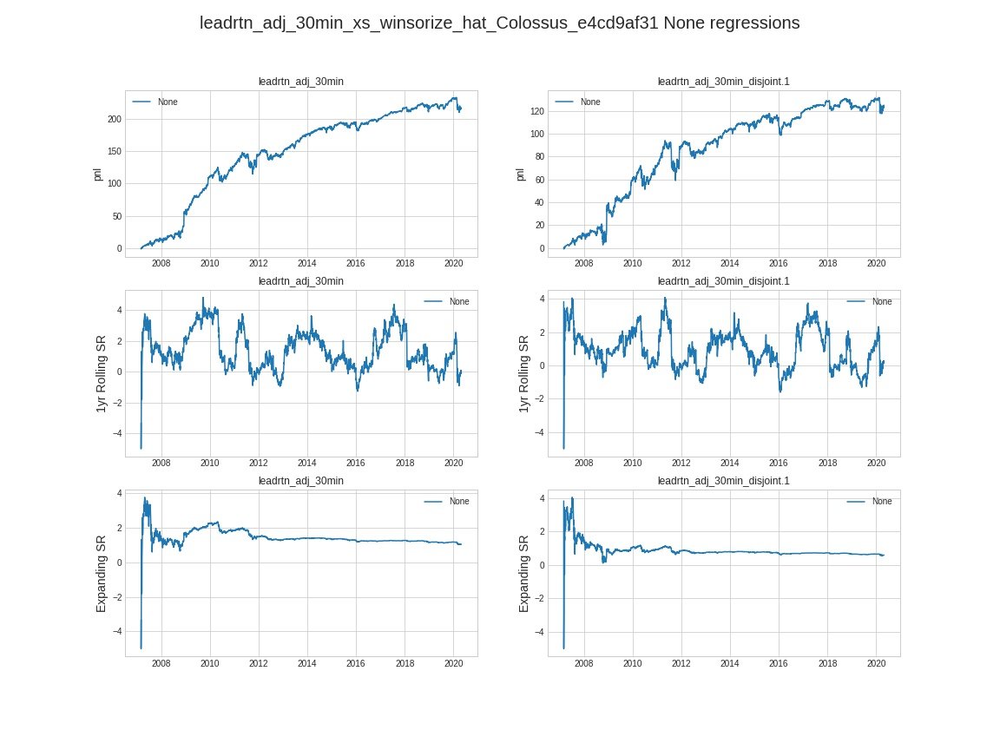

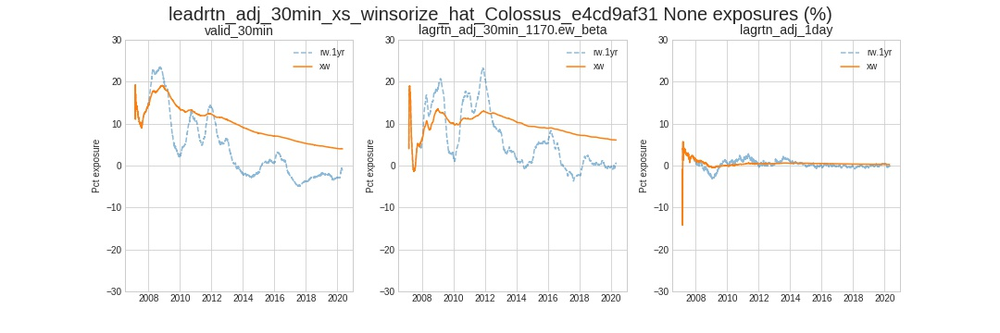

,0
leadrtn_adj_1day_hat_Colossus_d0136c8b1,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_b8588ea29,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0373847a3,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_c54099806,fcst_3
leadrtn_adj_30min_xs_winsorize_hat_Colossus_e4cd9af31,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.453243,0.411049,0.036639,0.075880
fcst_1,0.453243,1.000000,0.901253,0.326649,0.252166
fcst_2,0.411049,0.901253,1.000000,0.385812,0.294412
fcst_3,0.036639,0.326649,0.385812,1.000000,0.456623
fcst_4,0.075880,0.252166,0.294412,0.456623,1.000000


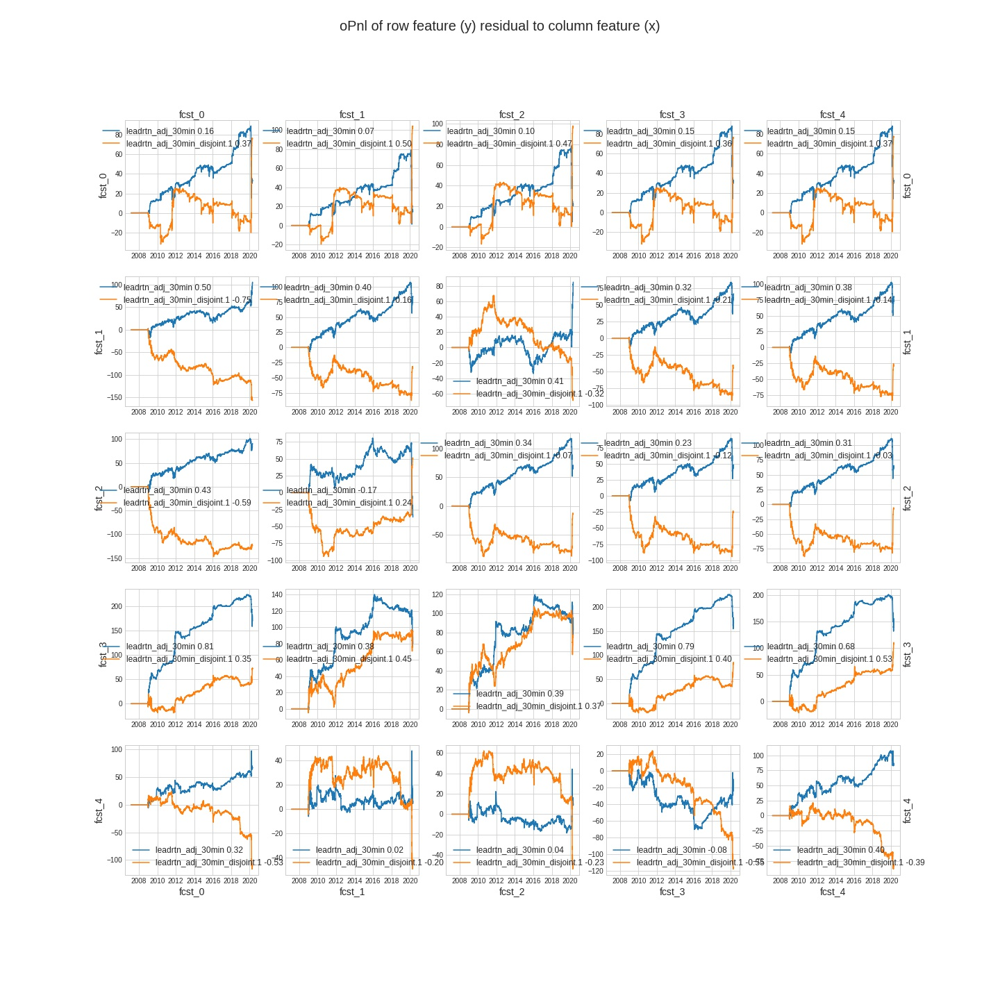

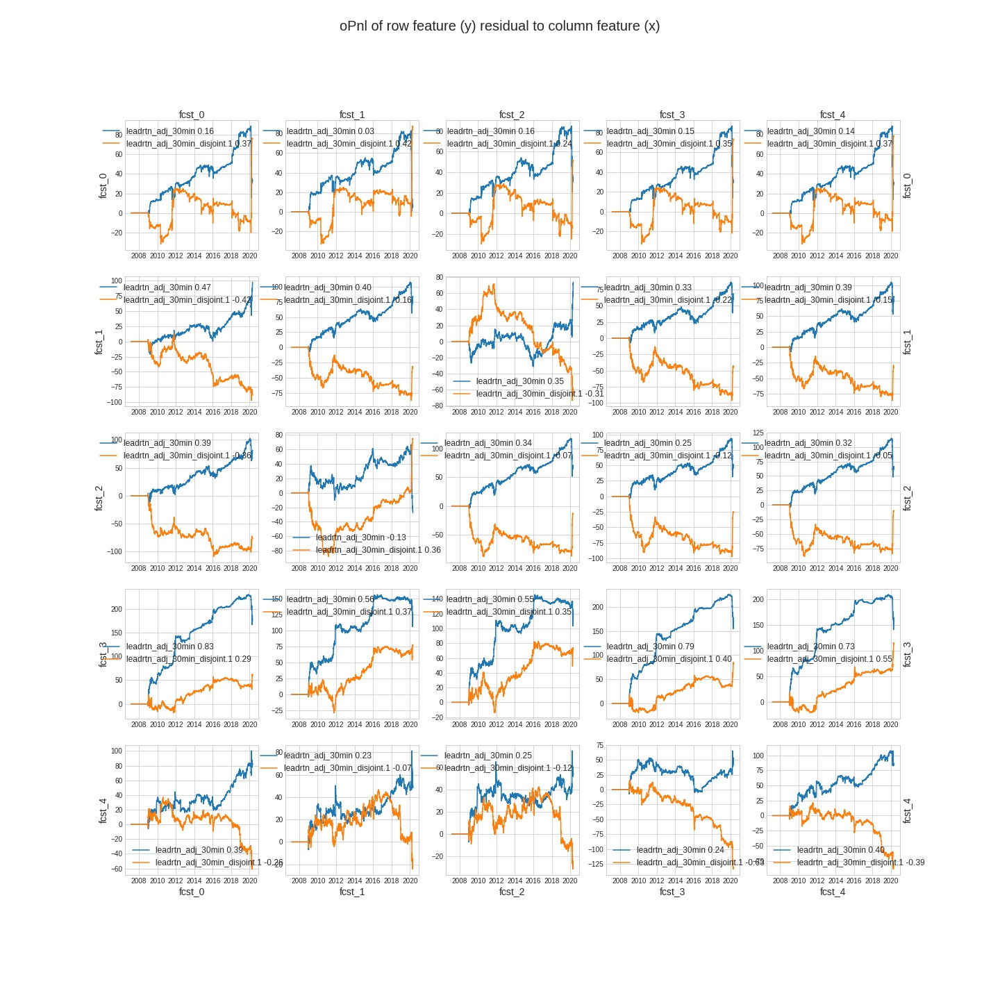

In [12]:
# Colossus_e4cd9af31
############################################################################
BASELINE_NAME =  'Colossus_e4cd9af31'
PREV_BASELINE = 'Colossus_c54099806'
BASELINE_NOTES = 'Baseline for centauri corpus on 30min data - not great -more tuning will be needed'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 13
data = disjoint_returns 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1'],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_30min'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=False,
        minibatch=20,
        batch_size=2000,
        burn_in=10000,
        priming=200,        
        # defaults and zeta
        transformer=mx.HPSet(  winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3)  ), 
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, 
        tv=None,
        ortho=5,
        num_its=1,
        corpii = [
            mx.HPSet( 
                type='centauri', mode='bilinear', act=None, ma=100, ar=10, use_X=True, dilation=1, ridge=1e-7, 
                lr=1e-7, use_bias=True, halflife_polyak=10,                
                transformer=mx.HPSet( 
                    winsorize=0.05, 
                    pre_normalize=mx.HPSet( halflife=100, clip=3 ),                     
                    subset=None, transform=None, hydra=False, 
                    #ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY],                     
                    post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=9 ) 
                ),                
                #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
#             mx.HPSet( 
#                 type='alpha', mode='bilinear', act=None, rank=10, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
#                 transformer=mx.HPSet( 
#                     winsorize=0.05, 
#                     pre_normalize=mx.HPSet( halflife=100, clip=3 ),                     
#                     subset=None, transform=None, hydra=False, 
#                     #ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                     post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) 
#                 ),                
#                 #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),
#             mx.HPSet( 
#                 type='alpha', mode='linear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-6, use_bias=True,
#                 transformer=mx.HPSet( 
#                     winsorize=0.05, 
#                     pre_normalize=mx.HPSet( halflife=100, clip=3 ), 
#                     subset=None, transform=None, hydra=True, 
#                     #rectifier=mx.HPSet( halflife=None, demean=False, normalize=True, clip=3, ridge=1e-6, algo='gd', lr=1e-3 ),                    
#                     ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                     post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) 
#                 ),                
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),            
#             mx.HPSet( 
#                 type='alpha', mode='bilinear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
#                 transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
#                                         hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                                         post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
#             ),
#             mx.HPSet( 
#                 type='gamma', lr=1e-4, ridge=1e-5, use_bias=True, halflife_polyak=20, halflifes_adam=20, mode='linear', act=None, ar=None, ma=None, dilation=None,
#                 C_transformer=None, Yh_transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                   
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),
#             mx.HPSet( 
#                 type='omega', lr=1e-2, ridge=1e-9, halflife_polyak=20, act='tanh',
#                 transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) )
#             ),
#             mx.HPSet( type='theta', lr=1e-4, ridge=1e-3, shift=None, hyper_tune=None, act='simplex' ),
        ],        
    )
)
    

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_0ead1dccf
## Testing α-γ corpus (no arma in γ)

/home/fj/cloud/code/madmax/experiment/hpset.py:17: UserWarning: converting dict hyper_tune={'hypergrad': {'lr': 1000.0, 'decay': 0.8, 'ridge': 0, 'style': 'log'}}  to OrderedDict - use HPSet instead 
  warnings.warn( f'converting dict {k}={v}  to OrderedDict - use HPSet instead ' )


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,0.094066,1.261292,0.020350,0.000414,25.367361,3.239649,0.691401,0.696517,0.653941
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,0.094066,0.979112,0.011797,0.000139,14.706608,1.726321,0.691401,0.696517,0.653941


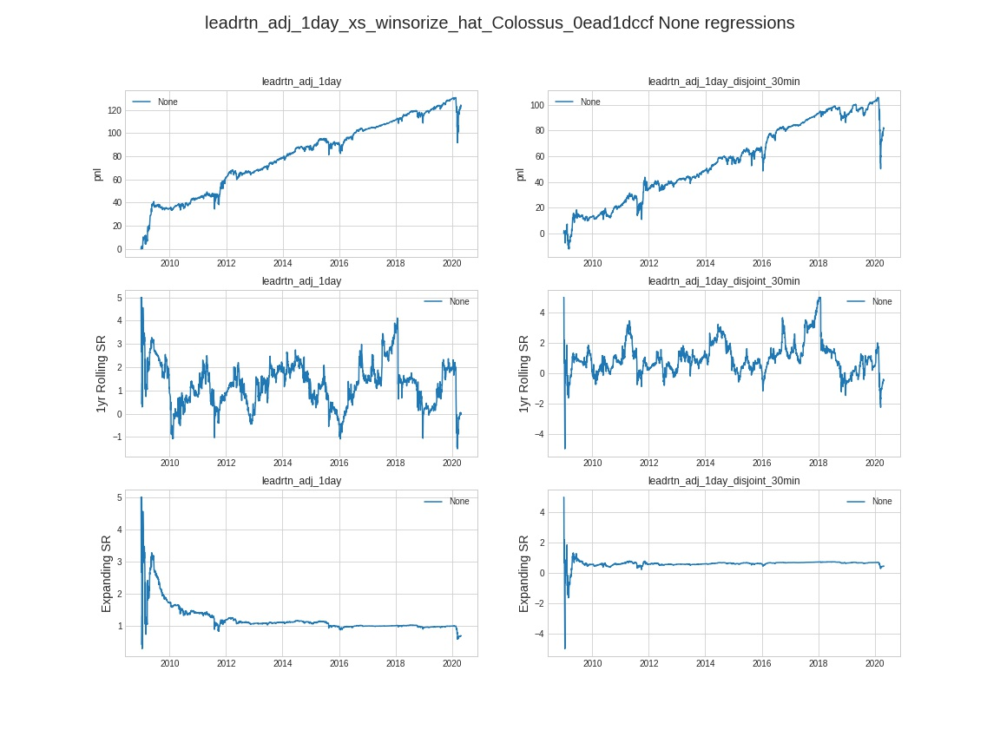

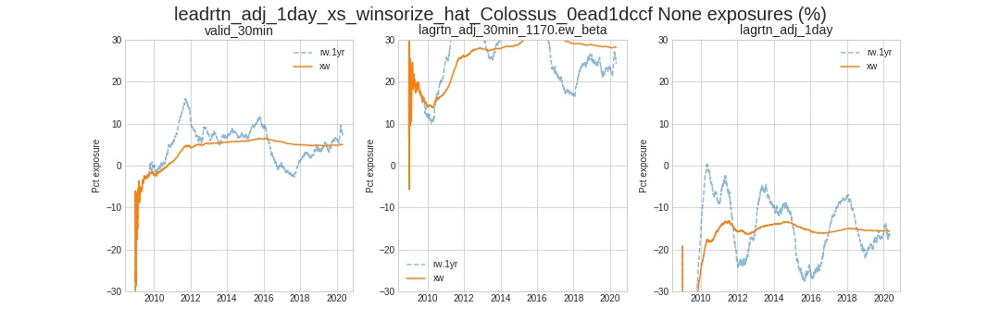

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0ead1dccf,fcst_0


,fcst_0
fcst_0,1.0


,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.747939,0.748249


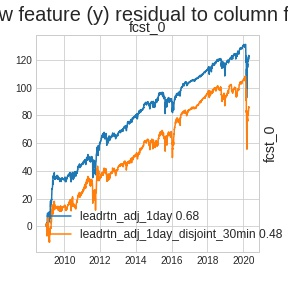

,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.747939,0.748249


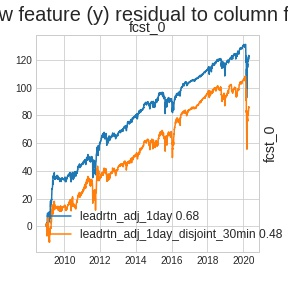

In [25]:
# Colossus_0ead1dccf
############################################################################
BASELINE_NAME = 'Colossus_0ead1dccf'
PREV_BASELINE = None
BASELINE_NOTES = 'Testing α-γ corpus (no arma in γ)'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=False,
        minibatch=20,
        batch_size=3000,
        burn_in=3000,
        priming=200,        
        # defaults and zeta
        transformer=mx.HPSet(  winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3)  ), 
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, 
        tv=None,
        ortho=5,
        num_its=1,
        corpii = [
            mx.HPSet( 
                type='alpha', mode='bilinear', act=None, rank=10, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
                transformer=mx.HPSet( 
                    winsorize=0.05, 
                    pre_normalize=mx.HPSet( halflife=100, clip=3 ),                     
                    subset=None, transform=None, hydra=False, 
                    #ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                    post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) 
                ),                
                #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='gamma', lr=1e-4, ridge=1e-5, use_bias=True, halflife_polyak=20, halflifes_adam=20, mode='linear', 
                act=None, ar=None, ma=None, dilation=None,
                C_transformer=None, Yh_transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                   
                hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
#             mx.HPSet( 
#                 type='omega', lr=1e-2, ridge=1e-9, halflife_polyak=20, act='tanh',
#                 transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) )
#             ),
        ],        
    )
)
    

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_2df1a32bc
## Testing α-γ corpus with arma in γ (follows Colossus_0ead1dccf) 

/home/fj/cloud/code/madmax/experiment/hpset.py:17: UserWarning: converting dict hyper_tune={'hypergrad': {'lr': 1000.0, 'decay': 0.8, 'ridge': 0, 'style': 'log'}}  to OrderedDict - use HPSet instead 
  warnings.warn( f'converting dict {k}={v}  to OrderedDict - use HPSet instead ' )


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,-0.014371,1.287357,0.022151,0.000491,27.603844,3.965655,0.60215,0.479159,0.345585
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,-0.014371,0.683497,0.002490,0.000006,3.051947,0.359785,0.60215,0.479159,0.345585


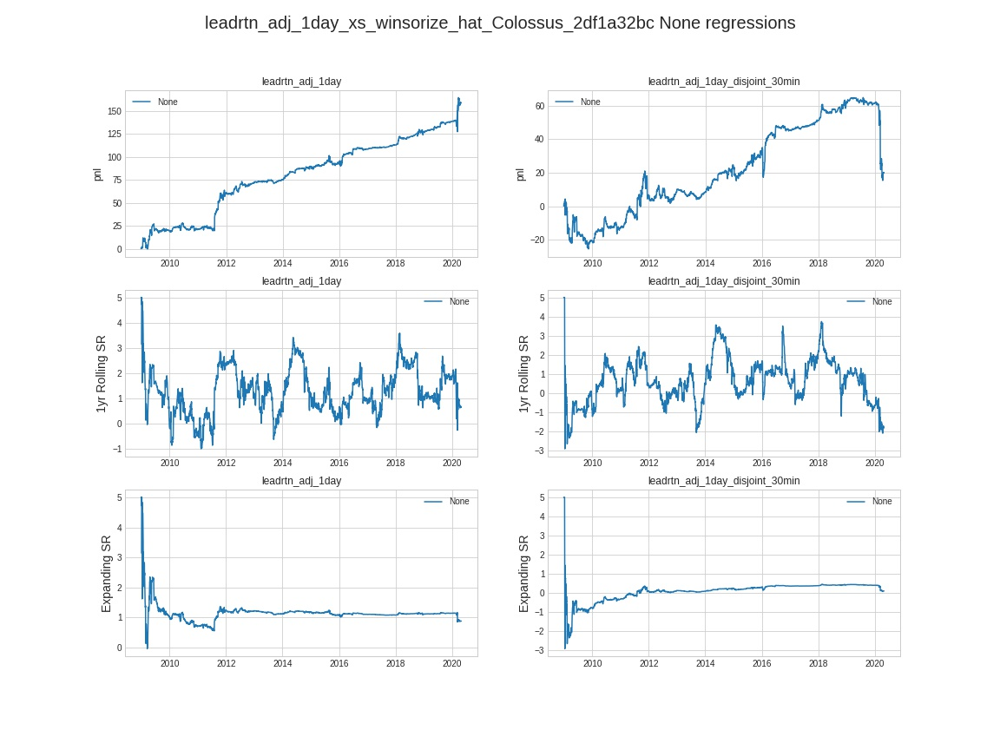

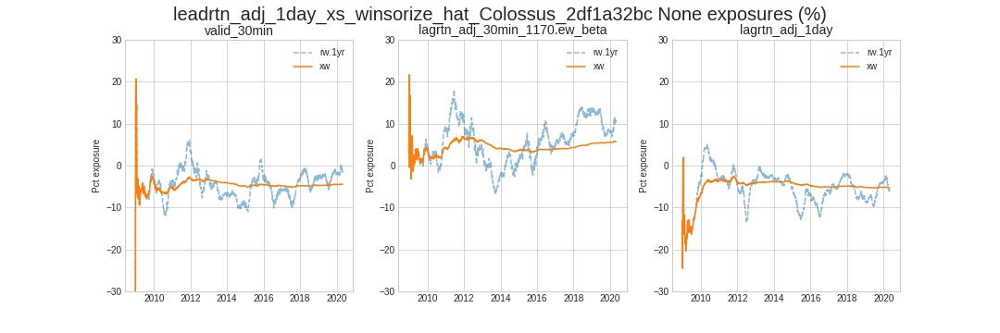

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0ead1dccf,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_2df1a32bc,fcst_1


,fcst_0,fcst_1
fcst_0,1.00000,0.36773
fcst_1,0.36773,1.00000


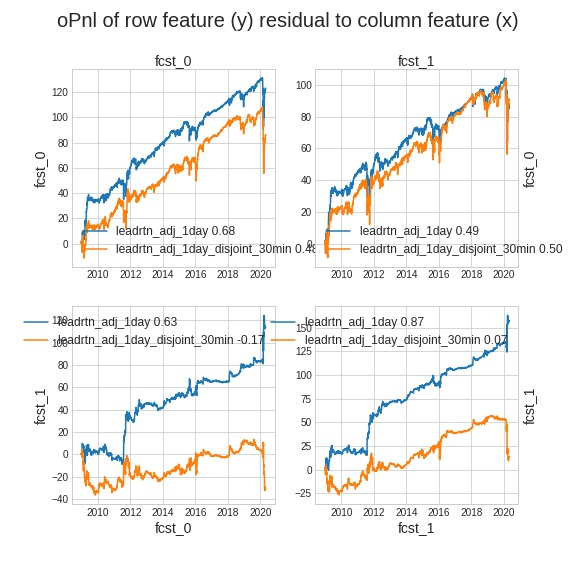

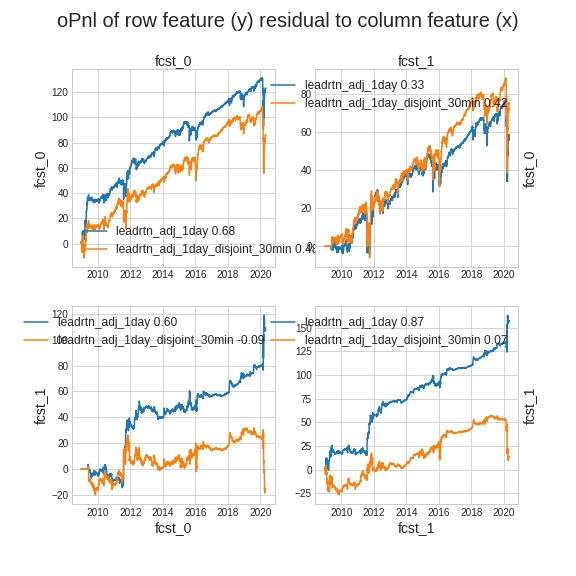

In [32]:
# Colossus_2df1a32bc
############################################################################
BASELINE_NAME = 'Colossus_2df1a32bc'
PREV_BASELINE = 'Colossus_0ead1dccf'
BASELINE_NOTES = 'Testing α-γ corpus with arma in γ'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=False,
        minibatch=20,
        batch_size=3000,
        burn_in=3000,
        priming=200,        
        # defaults and zeta
        transformer=mx.HPSet(  winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3)  ), 
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, 
        tv=None,
        ortho=5,
        num_its=1,
        corpii = [
            mx.HPSet( 
                type='alpha', mode='bilinear', act=None, rank=10, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
                transformer=mx.HPSet( 
                    winsorize=0.05, 
                    pre_normalize=mx.HPSet( halflife=100, clip=3 ),                     
                    subset=None, transform=None, hydra=False, 
                    #ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                    post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) 
                ),                
                #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='gamma', lr=1e-4, ridge=1e-5, use_bias=True, halflife_polyak=20, halflifes_adam=20, mode='linear', 
                act=None, ar=10, ma=10, dilation=1,
                C_transformer=None, Yh_transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                   
                hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
#             mx.HPSet( 
#                 type='omega', lr=1e-2, ridge=1e-9, halflife_polyak=20, act='tanh',
#                 transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) )
#             ),
        ],        
    )
)
    

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_0902fb776
## Testing α-Η corpus  (follows Colossus_2df1a32bc) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,0.013927,1.125349,0.009851,9.703636e-05,12.254533,1.227337,0.689316,0.692183,0.616073
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,0.013927,0.814099,-0.000244,5.960464e-08,-0.765356,-0.061426,0.689316,0.692183,0.616073


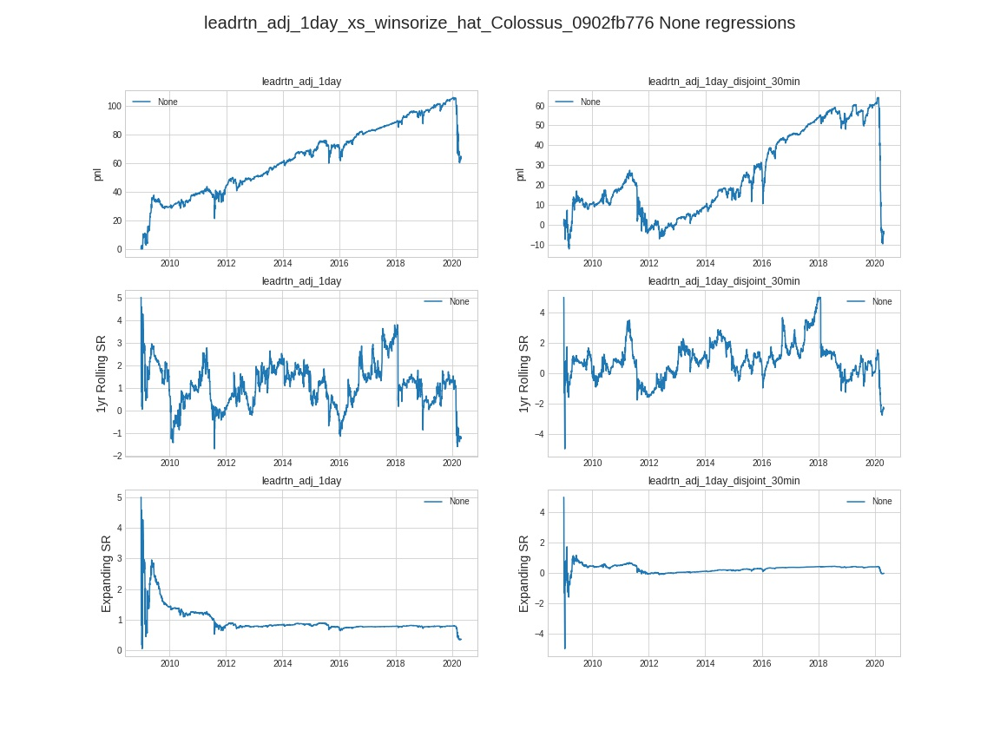

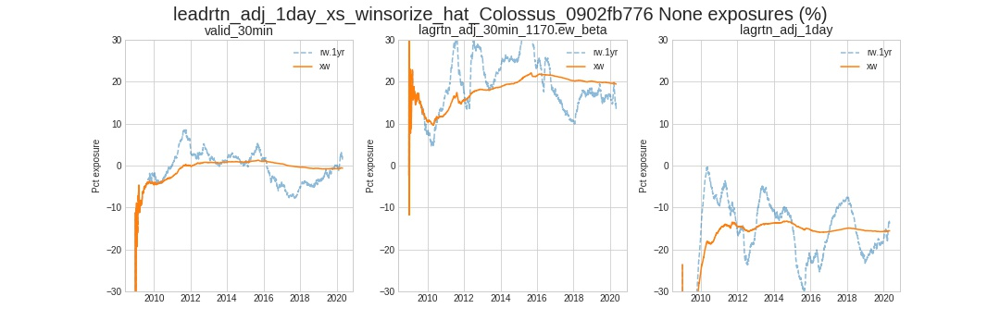

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0ead1dccf,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_2df1a32bc,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0902fb776,fcst_2


,fcst_0,fcst_1,fcst_2
fcst_0,1.000000,0.367730,0.920245
fcst_1,0.367730,1.000000,0.348325
fcst_2,0.920245,0.348325,1.000000


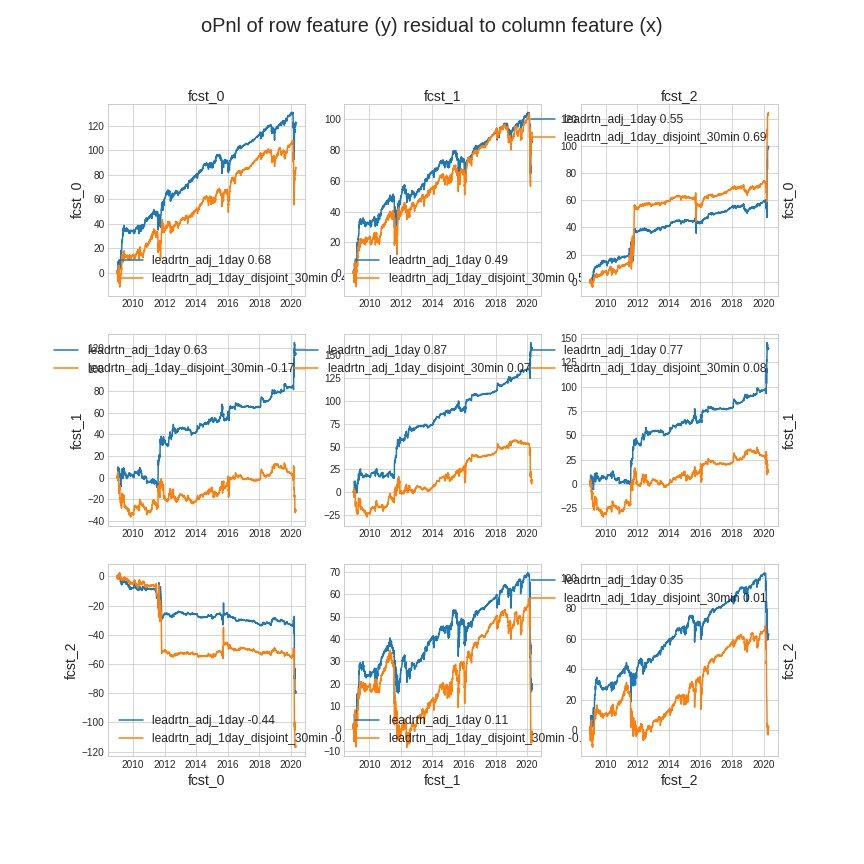

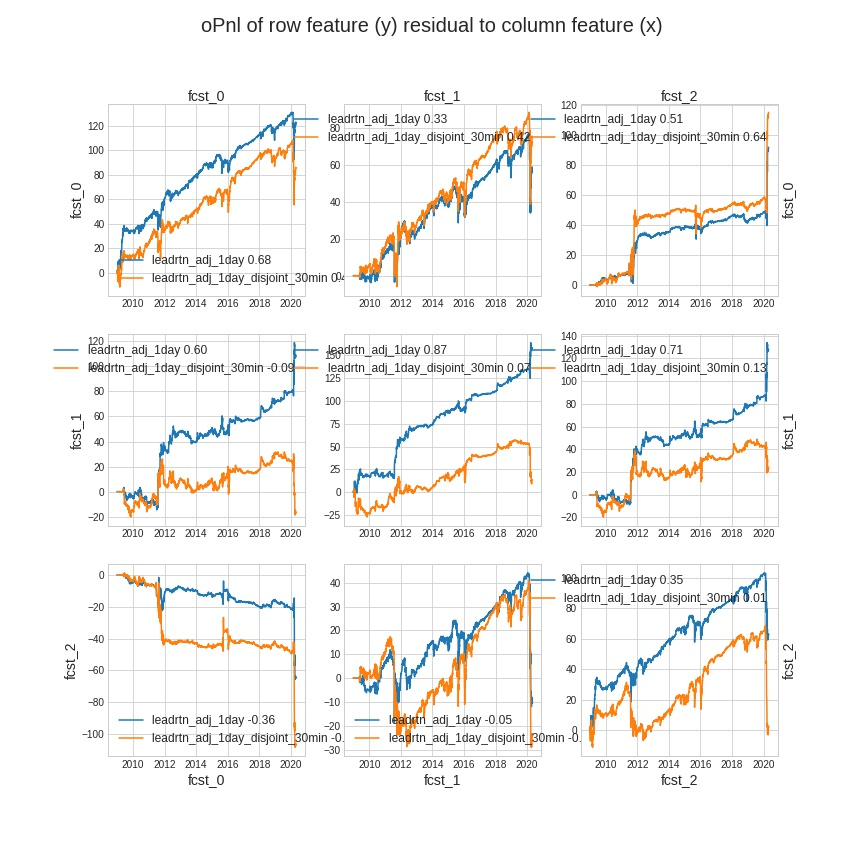

In [8]:
# Colossus_0902fb776
############################################################################
BASELINE_NAME = 'Colossus_0902fb776'
PREV_BASELINE = 'Colossus_2df1a32bc'
BASELINE_NOTES = 'Testing α-Η corpus '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=False,
        minibatch=20,
        batch_size=3000,
        burn_in=3000,
        priming=200,        
        # defaults and zeta
        transformer=mx.HPSet(  winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3)  ), 
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, 
        tv=None,
        ortho=5,
        num_its=1,
        corpii = [
            mx.HPSet( 
                type='alpha', mode='bilinear', act=None, rank=10, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
                transformer=mx.HPSet( 
                    winsorize=0.05, 
                    pre_normalize=mx.HPSet( halflife=100, clip=3 ),                     
                    subset=None, transform=None, hydra=False, 
                    #ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                    post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) 
                ),                
                #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='hydra', lr=1e-3, ridge=1e-5, use_bias=True, activations=(None, 'tanh', 'sech', 'relu', 'tanhsech',),
                transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=9) ),                   
                #halflife_polyak=20, halflifes_adam=20,                
                #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
#             mx.HPSet( 
#                 type='gamma', lr=1e-4, ridge=1e-5, use_bias=True, halflife_polyak=20, halflifes_adam=20, mode='linear', 
#                 act=None, ar=10, ma=10, dilation=1,
#                 C_transformer=None, Yh_transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                   
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),
#             mx.HPSet( 
#                 type='omega', lr=1e-2, ridge=1e-9, halflife_polyak=20, act='tanh',
#                 transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) )
#             ),
        ],        
    )
)
    

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



In [8]:
# None
############################################################################
BASELINE_NAME = None
PREV_BASELINE = 'Colossus_0902fb776'
BASELINE_NOTES = 'Retesting Colossus_c54099806'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(        
        end_to_end=False,
        minibatch=20,
        batch_size=3000,
        burn_in=3000,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, 
        num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, 
            transformer=mx.HPSet(  winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3)  ), 
            tv=None, ortho=5, boost=1, loss='psr', kappa=2, halflife_kappa=None,
        ),
        corpii = [
#             mx.HPSet( 
#                 type='centauri', mode='bilinear', act=None, ma=1, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
#                 transformer=mx.HPSet( 
#                     winsorize=0.05, 
#                     pre_normalize=mx.HPSet( halflife=100, clip=3 ),                     
#                     subset=None, transform=None, hydra=False, 
#                     #ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                     post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=9 ) 
#                 ),                
#                 #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),
            mx.HPSet( 
                type='alpha', mode='bilinear', act=None, rank=10, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
                transformer=mx.HPSet( 
                    winsorize=0.05, 
                    pre_normalize=mx.HPSet( halflife=100, clip=3 ),                     
                    subset=None, transform=None, hydra=False, 
                    #ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                    post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) 
                ),                
                #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
            ),
#             mx.HPSet( 
#                 type='alpha', mode='linear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-6, use_bias=True,
#                 transformer=mx.HPSet( 
#                     winsorize=0.05, 
#                     pre_normalize=mx.HPSet( halflife=100, clip=3 ), 
#                     subset=None, transform=None, hydra=True, 
#                     #rectifier=mx.HPSet( halflife=None, demean=False, normalize=True, clip=3, ridge=1e-6, algo='gd', lr=1e-3 ),                    
#                     ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                     post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) 
#                 ),                
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),            
#             mx.HPSet( 
#                 type='alpha', mode='bilinear', act=None, rank=None, H=1, ar=10, ridge=1e-7, lr=1e-7, use_bias=True,
#                 transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
#                                         hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
#                                         post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
#             ),
#             mx.HPSet( 
#                 type='gamma', lr=1e-4, ridge=1e-5, use_bias=True, halflife_polyak=20, halflifes_adam=20, mode='linear', act=None, ar=None, ma=None, dilation=None,
#                 C_transformer=None, Yh_transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                   
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
#             ),
#             mx.HPSet( 
#                 type='omega', lr=1e-2, ridge=1e-9, halflife_polyak=20, act='tanh',
#                 transformer=mx.HPSet( winsorize=0.05, post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
#                 hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) )
#             ),
#             mx.HPSet( type='theta', lr=1e-4, ridge=1e-3, shift=None, hyper_tune=None, act='simplex' ),
        ],        
    )
)
    

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



KeyboardInterrupt: 

# Add PCA features
----
* do this at 30min freq and then downsample to daily

In [19]:
## add pca features to the 30min data and then downsample to the daily data
########################################
mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )

# global hps
phps = mx.HPSet(
    targets='lagrtn_adj_30min',
    weight='valid_30min',
    ortho_features=['valid_30min'] + hps.feature_set.betas, # take out tilt and market
    batch_size=5000,
    start='20070301',
    end=hps.end,
    ints_per_day=13,    
    # online pca params
    halflife=30 * 13,
    rank=2,
    kappa=1e-1,
    ortho=1,
    tv=None,
    ortho_halflife=None,    
    ridge=1e-6,
    plots=True,
)

from research.etf_technical import furyroad_runner as frr; reload( frr )
disp( mx.tensorboard.kill_server( ) )
disp( mx.tensorboard.start( clear=True ) )    
disp( mx.tensorboard.start_server( ) )


@mx.operatorize( consumes_features=False, produces_features=True, produces_meta=True, memoize=True )
def build_boosted_pca_features( data, input_data, phps ):
    # a boosted sequence of pca runners
    data = mx.Source.dataarray( input_data )
    output_factors = []
    output_eigens = []
    output_meta = {}
    for target in ['lagrtn_adj_30min', 'lagrtn_adj_1day']:
        for halflife in [10, 30, 90, 252]:
            with mx.timer( f'running pca {target} {halflife}' ):
                # chain the ortho features, the data and convert halflife days into intervals
                pca_runner = frr.OnlinePCARunner(
                    weight=phps.weight, rank=phps.rank, kappa=phps.kappa, ridge=phps.ridge, tv=phps.tv,  halflife=halflife*phps.ints_per_day,                     
                    ortho_features=phps.ortho_features+output_factors, ortho=phps.ortho, ortho_halflife=phps.ortho_halflife,
                    suffix=f'_{target}_hl.{halflife}d', start=phps.start, end=phps.end, 
                    batch_size=1000 if (target=='lagrtn_adj_1day' and halflife==252) else phps.batch_size, 
                    dtype=dtype, device=device,
                ).set( memoize=True, data=data, features=target )                 
                disp( pca_runner.hash(), halflife, target, h=3 )
                # chain the data for the next iteration
                da = pca_runner()
                output_factors += pca_runner.output_meta['output_factors']
                output_eigens += pca_runner.output_meta['output_eigens']
                output_meta['pca_runner_{target}_{halflife}d'] = pca_runner.output_meta
                data = pca_runner
                if phps.plots:                    
                    disp( 'created ', output_factors )
                    disp( 'orthogonalize ', pca_runner.ortho_features )
                    for key in ['pnl', 'ics', 'oics', 'ac1s']:
                        disp( key, pca_runner.output_meta[key], h=4 )
    output_meta['output_factors'] = output_factors
    output_meta['output_eigens'] = output_eigens
    return da, output_factors, output_meta

boosted_pca = build_boosted_pca_features( phps=phps, input_data=disjoint_returns.checkpointer.find('output_data').filename[0] )
boosted_pca.data = None
boosted_pca.memoize=True
disp( 'expected build_boosted_pca_features_bd0236ba4 got', boosted_pca.hash(), color='magenta' )
da = boosted_pca()

# assign the features
hps.feature_set.pca_features = boosted_pca.output_features

#inner join with teh daily dataset
daily_boosted_pca = mx.ConcatFeatures( daily_data, boosted_pca, join='inner', verbose=True )
disp( 'expected FeatureConcater_1c333759b got', daily_boosted_pca.hash(), color='red' )
dda = daily_boosted_pca()



In [7]:
# None
############################################################################
BASELINE_NAME = None
PREV_BASELINE = None
BASELINE_NOTES = '30min data'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 13
data = disjoint_returns 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1'],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_30min'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=True,
        minibatch=20,
        batch_size=2000,
        burn_in=2000,
        priming=200,        
        # defaults
        boost=1e-1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, #dict( hypergrad=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),
        tv=None,
        ortho=5,
        alpha=mx.HPSet(
            mode='bilinear', #with mean and avg-norm normalization
            act=None,
            rank=None,
            M=1,
            ar=10,
            ridge=1e-7,
            lr=1e-7,                        
            use_bias=True,
            halflifes_adam=10,
            halflife_polyak=None,
            ortho=5,
            transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
                                  hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                                  post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
        ),
        omega=mx.HPSet( lr=1.0, ridge=1e-9, shift=None, transformer=None, halflife_polyak=20, act='tanh' ),
        gamma=mx.HPSet( lr=1.0, ridge=1e-9, use_bias=True, transformer=None, halflife_polyak=20, halflifes_adam=20, mode='linear', act=None ),
        theta=None, #mx.HPSet( lr=1e-4, ridge=1e-3, shift=None, hyper_tune=None, act='simplex' ),
        zeta_transformer=mx.HPSet( winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3) ), 
    ),    
)



mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



/home/fj/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1392: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


KeyError: "not all values found in index 'features'"